In [1]:
import os
import sys

sys.path.append(os.path.abspath("../src"))

In [2]:
# Import packages
import logging
import os
from pathlib import Path

import matplotlib.pyplot as plt
import muspan as ms
import numpy as np
import scanpy as sc
import spatialdata as sd
import squidpy as sq
import seaborn as sns
import pandas as pd

In [3]:
# Set variables
module_name = "6_muspan"  # name of the module

In [4]:
# Set directories
base_dir = "/Users/sarapatti/Desktop/PhD_projects/Llyod_lab/ReCoDe-spatial-transcriptomics"
input_path = base_dir
output_path = Path(base_dir) / "analysis"
logging_path = Path(output_path) / "logging"
zarr_path = Path(input_path) / "data/xenium.zarr"

# Confirm directories exist
if not Path(input_path).exists():
    raise FileNotFoundError(f"Input path {input_path} does not exist.")
if not Path(output_path).exists():
    raise FileNotFoundError(f"Output path {output_path} does not exist.")
if not Path(zarr_path).exists():
    raise FileNotFoundError(f"Logging path {zarr_path} does not exist.")

In [5]:
# Create output directories if they do not exist
os.makedirs(Path(output_path) / module_name, exist_ok=True)

# Set up logging
os.makedirs(
    logging_path, exist_ok=True
)  # should set up all these directories at the start of the pipeline?
logging.basicConfig(
    filename=Path(logging_path) / f"{module_name}.txt",  # output file
    filemode="w",  # overwrites the file each time
    format="%(asctime)s - %(levelname)s - %(message)s",  # log format
    level=logging.INFO,  # minimum level to log
)


# change directory to output_path/module_name
os.chdir(
    Path(output_path) / module_name
)  # need to so plots save in the correct directory

In [6]:
# Set colors
color_map = sns.color_palette("Blues", as_cmap=True)

In [7]:
# Load data
adata = sc.read_h5ad("/Users/sarapatti/Desktop/PhD_projects/Llyod_lab/ST_Xenium_Asthma/analysis/h5ad/xenium_annotated.h5ad")

In [8]:
# Import Regis' cluster labeling
matrix_epi = pd.read_excel("/Users/sarapatti/Desktop/PhD_projects/Llyod_lab/ST_Regis_analysis/data/Cell_matrices_D2C/matrix_epithelium_total_filter_asthma.xlsx")
matrix_muc = pd.read_excel("/Users/sarapatti/Desktop/PhD_projects/Llyod_lab/ST_Regis_analysis/data/Cell_matrices_D2C/Matrix_muc_gland_total_asthma.xlsx")

In [9]:
# Format matrix
matrix_epi.index = matrix_epi["Cell_ID"]
matrix_epi = matrix_epi.rename(columns={"Cluster": "Regis_cluster"})
matrix_epi["Patient"] = matrix_epi["Patient"].astype(str)
matrix_epi["ROI"] = "Epithelium"
matrix_epi

,Cell_ID,Regis_cluster,Pathology,Patient,Transcripts,ACE,ACE2,ACKR1,ADAM17,ADAM28,...,UPK3B,VEGFA,VEGFC,VSIG4,VWF,WFS1,WNT2,WT1,XCR1,ROI
Cell_ID,,,,,,,,,,,,,,,,,,,,,
aadeodah-1,aadeodah-1,Basal cells 1,Healthy,110032,87,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Epithelium
aadnbbbk-1,aadnbbbk-1,Basal cells 1,Healthy,110032,49,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,Epithelium
aadonleh-1,aadonleh-1,Basal cells 1,Healthy,110032,48,0,0,0,0,2,...,0,0,0,0,0,0,0,0,0,Epithelium
aadpbghk-1,aadpbghk-1,Basal cells 1,Healthy,110032,19,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Epithelium
aafjimli-1,aafjimli-1,Basal cells 1,Healthy,110032,113,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,Epithelium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hkcjgbai-1,hkcjgbai-1,SMCs 4,Asthma,110001,28,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Epithelium
manilhbg-1,manilhbg-1,SMCs 4,Asthma,110007,8,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Epithelium
mapjnddn-1,mapjnddn-1,SMCs 4,Asthma,110007,36,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Epithelium


In [10]:
matrix_muc.index = matrix_muc["Cell_ID"]
matrix_muc = matrix_muc.rename(columns={"Cluster": "Regis_cluster"})
matrix_muc["Patient"] = matrix_muc["Patient"].astype(str)
matrix_muc["ROI"] = "Mucosal_gland"
matrix_muc

,Cell_ID,Regis_cluster,Transcripts,Patient,Pathology,ACE,ACE2,ACKR1,ADAM17,ADAM28,...,UPK3B,VEGFA,VEGFC,VSIG4,VWF,WFS1,WNT2,WT1,XCR1,ROI
Cell_ID,,,,,,,,,,,,,,,,,,,,,
fjkkcgcb-1,fjkkcgcb-1,Basal cells 1,21,110032,Healthy,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Mucosal_gland
fjkmecdi-1,fjkmecdi-1,Basal cells 1,20,110032,Healthy,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,Mucosal_gland
fkeggnmf-1,fkeggnmf-1,Basal cells 1,35,110032,Healthy,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Mucosal_gland
fkehnhkj-1,fkehnhkj-1,Basal cells 1,72,110032,Healthy,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,Mucosal_gland
knndgahg-1,knndgahg-1,Basal cells 1,27,110040,Healthy,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Mucosal_gland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gfpadpfl-1,gfpadpfl-1,SMCs 4,18,110001,Asthma,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Mucosal_gland
gfpajmjo-1,gfpajmjo-1,SMCs 4,26,110001,Asthma,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Mucosal_gland
gfpbphdi-1,gfpbphdi-1,SMCs 4,52,110001,Asthma,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Mucosal_gland


In [11]:
# Combine both matrices
matrix = pd.concat([matrix_epi, matrix_muc], axis=0) # combine based on columns
print("Number of cells from each",matrix["ROI"].value_counts())

matrix = matrix[["Cell_ID", "ROI", "Regis_cluster", "Pathology", "Patient"]]
matrix.rename(columns={matrix.columns[0]: 'cell_id'}, inplace=True)
print(matrix['cell_id'].duplicated().sum())
matrix = matrix.drop_duplicates(subset='cell_id')

Number of cells from each ROI
Epithelium       23105
Mucosal_gland    19583
Name: count, dtype: int64
6


In [12]:
adata.obs = adata.obs.join(matrix.set_index('cell_id'), how='left')
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,pct_counts_in_top_50_genes,n_counts,leiden_1.0,new_clusters,ROI,Regis_cluster,Pathology,Patient
aaadnhbi-1,aaadnhbi-1,1647.581299,5919.916992,14,0,0,0,0,14.0,804.232842,...,92.857143,100.000000,100.0000,14.0,5,5,Epithelium,SMCs 1,Healthy,110028
aaaoajok-1,aaaoajok-1,2413.369385,3389.042480,15,0,0,0,0,15.0,93.789535,...,66.666667,100.000000,100.0000,15.0,15,15,Epithelium,Cluster 3,Healthy,110032
aabgppbe-1,aabgppbe-1,2429.717041,3389.562744,36,0,0,0,0,36.0,263.215791,...,61.111111,88.888889,100.0000,36.0,7,SMC,Epithelium,Endothelial cells 2,Healthy,110032
aabhhaho-1,aabhhaho-1,2443.484375,3395.104492,22,0,0,0,0,22.0,160.304693,...,63.636364,100.000000,100.0000,22.0,7,SMC,Epithelium,Endothelial cells 2,Healthy,110032
aacnpnlp-1,aacnpnlp-1,2494.154541,3380.241211,11,0,0,0,0,11.0,148.699537,...,100.000000,100.000000,100.0000,11.0,3,Fibroblasts,Epithelium,Fibroblasts,Healthy,110032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ojcbmknb-1,ojcbmknb-1,8341.762695,20044.416016,37,0,0,0,0,37.0,110.497348,...,37.837838,64.864865,100.0000,37.0,10,10,NaN,NaN,NaN,NaN
ojcdjpnk-1,ojcdjpnk-1,8348.761719,20057.220703,39,0,0,0,0,39.0,261.815947,...,33.333333,58.974359,100.0000,39.0,12,NK cells,NaN,NaN,NaN,NaN
ojcdodjh-1,ojcdodjh-1,8351.383789,20081.843750,18,0,0,0,0,18.0,199.680945,...,66.666667,100.000000,100.0000,18.0,6,6,NaN,NaN,NaN,NaN
ojcgaphj-1,ojcgaphj-1,8350.867188,20041.492188,21,0,0,0,0,21.0,63.083284,...,47.619048,95.238095,100.0000,21.0,13,Macrophages,NaN,NaN,NaN,NaN


In [13]:
# Format Regis_cluster column to be a string
adata.obs["Regis_cluster"] = adata.obs["Regis_cluster"].astype('str') # convert to string

adata.obs.dtypes
adata.obs["Regis_cluster"].value_counts()

Regis_cluster
nan                             15407
Cluster 1                        7021
Cluster 2                        6672
Cluster 3                        3402
Endothelial cells 1              2843
Fibroblasts                      2581
Basal cells 1                    2470
Basal cells 2                    2148
Mast cells                       1923
SMCs 1                           1532
Ciliated cells 2                 1302
Goblet cells (Epithelium)        1142
Serous cells 1                   1125
Ciliated cells 1                 1068
Goblet cells (Mucous glands)      761
SMCs 2 Des+                       527
Serous cells 2                    490
Endothelial cells 2               424
Cluster 12                        320
SMCs 4                            294
SMCs 3 (Mucous glands)             16
Name: count, dtype: int64

In [14]:
# Import Xenium data using muspan
logging.info("Loading Xenium data for MuSpAn...")

area_path = Path(input_path) / "data/regis_d1.csv"
transcripts_of_interest = ["EPCAM", "CD3D", "CD68", "VWF", "PTPRC", "ACTA2"]

pc = ms.io.xenium_to_domain(
    path_to_xenium_data="/Users/sarapatti/Desktop/PhD_projects/Llyod_lab/ST_Xenium_Asthma/data/catalyst_release_RJ_IMPERIAL_Dec05/0013717_asthma_healthy",
    cells_from_selection_csv = area_path,
    domain_name='Regis',
    load_transcripts=True,
    selected_transcripts=transcripts_of_interest,
    load_nuclei=True,
    load_cells_as_shapes=True,
    exclude_no_nuclei_cells=True)

Domain name: Regis
Number of objects: 19486
Collections: ['Cell boundaries', 'Nucleus boundaries', 'Transcripts']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area', 'Transcript ID'] 
Networks: [] 
Distance matrices: []


In [15]:
# ...existing code...
cell_ids = pc.labels["Cell ID"]["labels"]

# Build a list of labels for ALL cell_ids, using "NA" if not found in adata.obs
filtered_regis_clusters = [
    str(adata.obs.loc[cid, "Regis_cluster"]) if cid in adata.obs.index else "NA"
    for cid in cell_ids
]

# Now filtered_regis_clusters will have the same length as cell_ids
pc.add_labels(
    label_name="Regis_cluster",
    labels=filtered_regis_clusters
)

In [16]:
pc.collections['Transcripts']

{'collection_name': 'Transcripts',
 'collection_name_integer': 2,
 'objects': array([14206., 14207., 14208., ..., 19483., 19484., 19485.])}

In [17]:
# Queries to isolate the different objects within the MuSpAn domain

# Query to isolate cell boundaries
qCells = ms.query.query(pc, ('Collection',), 'is', 'Cell boundaries')

# Query to isolate transcripts
qTrans = ms.query.query(pc, ('Collection',), 'is', 'Transcripts')

# Query to isolate nucleus boundaries
qNuc = ms.query.query(pc, ('Collection',), 'is', 'Nucleus boundaries')

In [18]:
print(pc.labels.keys())  # see all keys in the labels dictionary

dict_keys(['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area', 'Transcript ID', 'Regis_cluster'])


In [19]:
pc.labels["Cluster ID"]

{'labels': array(['Cluster 5', 'Cluster 4', 'Cluster 6', ..., 'Cluster 1',
        'Cluster 3', 'Cluster 3'], dtype='<U10'),
 'objects': array([0.000e+00, 1.000e+00, 2.000e+00, ..., 7.100e+03, 7.101e+03,
        7.102e+03]),
 'labelType': 'categorical',
 'categories': array(['Cluster 1', 'Cluster 10', 'Cluster 11', 'Cluster 12',
        'Cluster 13', 'Cluster 14', 'Cluster 15', 'Cluster 16',
        'Cluster 17', 'Cluster 18', 'Cluster 2', 'Cluster 3', 'Cluster 4',
        'Cluster 5', 'Cluster 6', 'Cluster 7', 'Cluster 8', 'Cluster 9',
        'Unassigned'], dtype='<U10'),
 'nCategories': 19,
 'labelToInteger': {'Cluster 1': 0,
  'Cluster 10': 1,
  'Cluster 11': 2,
  'Cluster 12': 3,
  'Cluster 13': 4,
  'Cluster 14': 5,
  'Cluster 15': 6,
  'Cluster 16': 7,
  'Cluster 17': 8,
  'Cluster 18': 9,
  'Cluster 2': 10,
  'Cluster 3': 11,
  'Cluster 4': 12,
  'Cluster 5': 13,
  'Cluster 6': 14,
  'Cluster 7': 15,
  'Cluster 8': 16,
  'Cluster 9': 17,
  'Unassigned': 18},
 'integerToLabel': 

Text(0.5, 1.0, 'Nuclei')

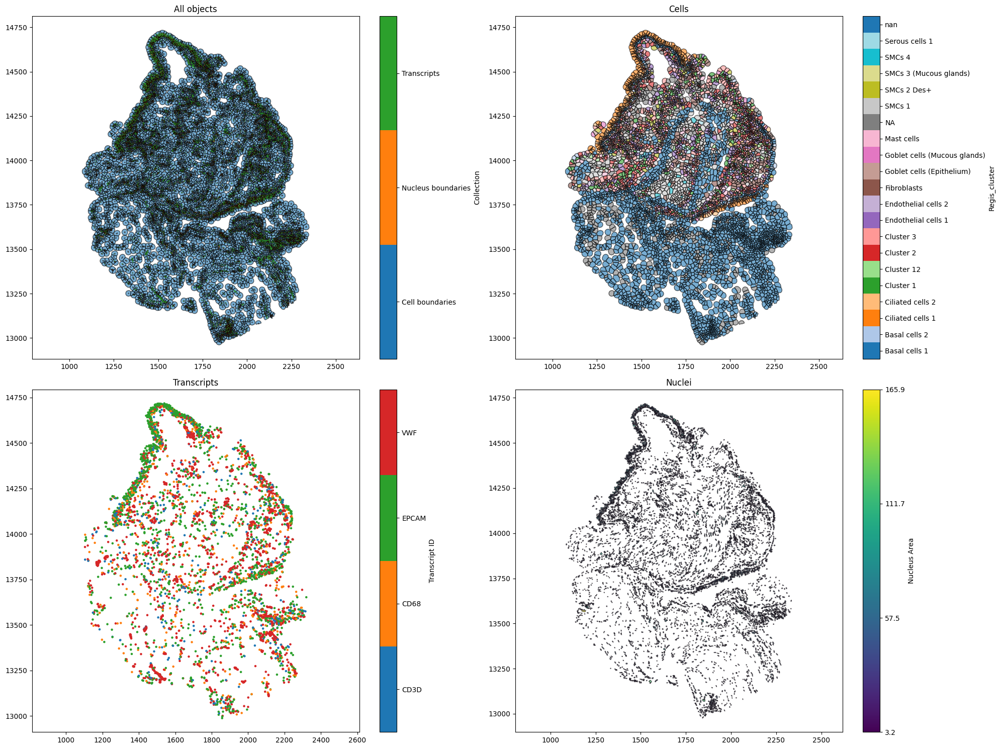

In [20]:
# Create a figure with 2x2 subplots
fig, ax = plt.subplots(figsize=(20, 15), nrows=2, ncols=2)

# Visualise all objects in the MuSpAn domain
ms.visualise.visualise(pc, ax=ax[0, 0], 
                       marker_size=0.05)
ax[0, 0].set_title('All objects')

# Visualise cells, colored by 'Regis_cluster'
ms.visualise.visualise(pc, 
                       color_by=('label', 'Regis_cluster'), 
                       ax=ax[0, 1], 
                       objects_to_plot=qCells)
ax[0, 1].set_title('Cells')

# Visualise transcripts, colored by 'Transcript'
ms.visualise.visualise(pc, 
                       color_by=('label', 'Transcript ID'), 
                       ax=ax[1, 0], 
                       objects_to_plot=qTrans, 
                       marker_size=5)
ax[1, 0].set_title('Transcripts')

# Visualise nuclei, colored by 'Nucleus Area'
ms.visualise.visualise(pc, color_by=('label', 'Nucleus Area'),
                       ax=ax[1, 1], 
                       objects_to_plot=qNuc, 
                       #vmin=20, 
                       #vmax=200
                       )
ax[1, 1].set_title('Nuclei')

# Creating spatial networks

## Delaunay networks from point-like data

If no boundary information about our spatial objects is given in our dataset (i.e., no segmentation mask), then Deluanay networks on point-like data are a common approximation of the local connectivity of the data. It’s construction is based on area (volume) filling process between all points such that edges are generated to produce triangles that do not contain any other point, therefore an edge between points presents the adjacency of the voronoi cells of the data.

Edge weights are values that can be used to describe the connectivity between nodes.

(<Figure size 1000x600 with 2 Axes>, <Axes: >)

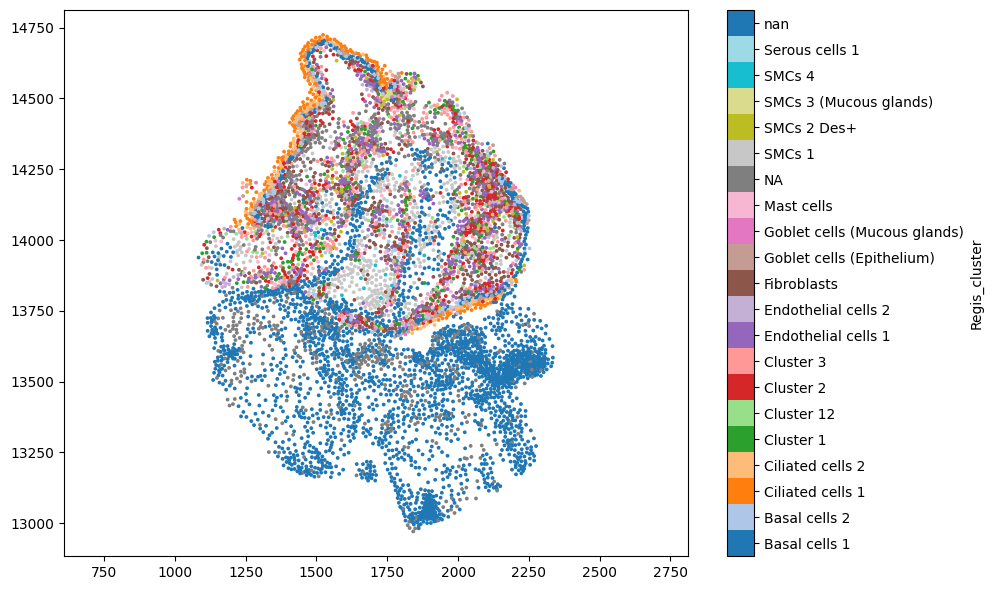

In [21]:
# Convert cell boundaries to cell centres (centroids)
pc.convert_objects(
    population=('Collection', 'Cell boundaries'),
    object_type='point',
    conversion_method='centroids',
    collection_name='Cell centroids',
    inherit_collections=False
)

# Plot the cell centres with color based on 'Cluster ID'
plt.figure(figsize=(10, 6))
ms.visualise.visualise(
    pc,
    objects_to_plot=('collection', 'Cell centroids'),
    color_by='Regis_cluster',
    ax=plt.gca(),
    marker_size=3
)

In [22]:
del_network = ms.networks.generate_network(pc,
                             network_name='Delaunay CC unfiltered',
                             network_type='Delaunay',
                             objects_as_nodes=('collection','Cell centroids')
                             )

# Generate a Delaunay network on the 'Cell centroids' data
# The network will be stored in the domain.networks dictionary with the name 'Delaunay CC'
del_network = ms.networks.generate_network(pc,
                             network_name='Delaunay CC filtered',
                             network_type='Delaunay',
                             objects_as_nodes=('collection','Cell centroids'),
                             min_edge_distance=0,
                             max_edge_distance=45
                             )

In [23]:
list(del_network.edges(data=True))[0]

(19486,
 20738,
 {'Distance': 9.143756588182411, 'Inverse Distance': 0.5516394172576841})

In [24]:
print('Delaunay CC unfiltered:',pc.networks['Delaunay CC unfiltered'])
print('Delaunay CC filtered:',pc.networks['Delaunay CC filtered'])

Delaunay CC unfiltered: Graph with 7103 nodes and 21274 edges
Delaunay CC filtered: Graph with 7103 nodes and 20940 edges


(<Figure size 2000x1200 with 2 Axes>,
 <Axes: title={'center': 'Delaunay CC filtered'}>)

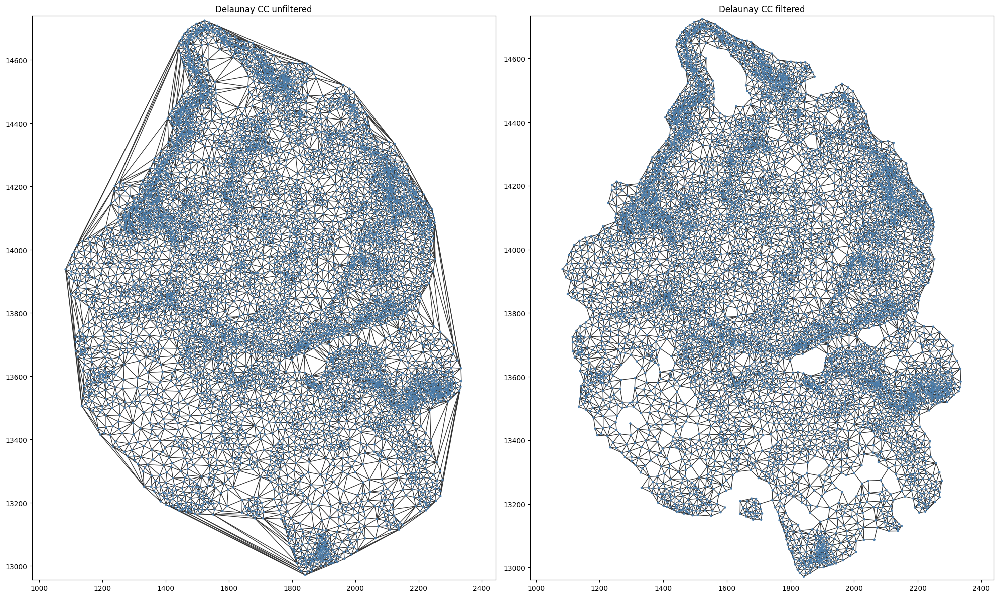

In [25]:
# Create a 1x2 subplot for visualizing the original and filtered Delaunay networks
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# Plot the original Delaunay network
ax[0].set_title('Delaunay CC unfiltered')
ms.visualise.visualise_network(
    pc,
    network_name='Delaunay CC unfiltered',
    ax=ax[0],
    edge_weight_name=None,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), 
                          marker_size=5, 
                          add_cbar=False,
                          color_by=('constant','#4D7EAB'))
)

# Plot the filtered Delaunay network
ax[1].set_title('Delaunay CC filtered')
ms.visualise.visualise_network(
    pc,
    network_name='Delaunay CC filtered',
    ax=ax[1],
    edge_weight_name=None,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'),
                          marker_size=5, 
                          add_cbar=False,
                          color_by=('constant','#4D7EAB'))
)

# Proximity based networks

Proximity networks are purely distance-based networks. Formally, in a Proximity network, any two nodes are connected if the distance between is within a specified range, which is defined in our case by max_edge_distance and min_edge_distance. These networks are particularly useful in spatial analysis where the physical distance between objects is a key factor. By adjusting the distance thresholds, we can explore how connectivity changes at different spatial scales. This can help in understanding the spatial organization and interactions within the dataset.

### Point-like objects

In [26]:
# Generate proximity networks with different maximum edge distances

distance_list = [10, 20, 50]
for distance in distance_list:
    ms.networks.generate_network(
        pc,
        network_name=f"prox network centroids {distance}",
        network_type='Proximity',
        objects_as_nodes=('collection', 'Cell centroids'),
        max_edge_distance=distance,
        min_edge_distance=0
    )

(<Figure size 2000x600 with 4 Axes>,
 <Axes: title={'center': 'Proximity network: 50 max distance'}>)

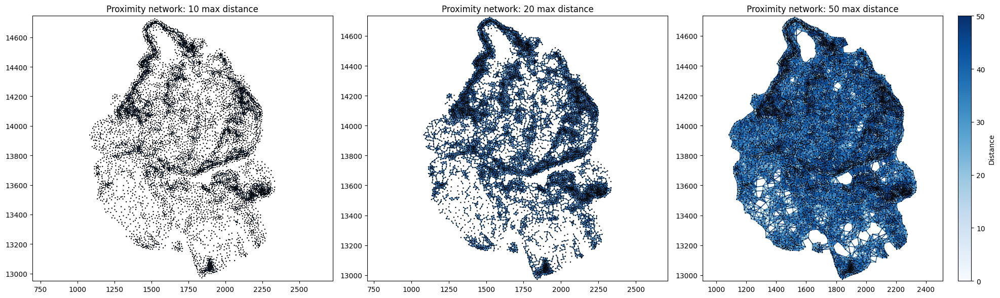

In [27]:
# Create a figure with 3 subplots arranged in a single row
fig, ax = plt.subplots(1, 3, figsize=(20, 6))

# Plot the proximity network with 10μm max distance
ax[0].set_title(f"Proximity network: {distance_list[0]} max distance")
ms.visualise.visualise_network(
    pc,
    network_name=f"prox network centroids {distance_list[0]}",
    ax=ax[0],
    edge_cmap=color_map,
    edge_vmin=0,
    edge_vmax=distance_list[0],
    add_cbar=False,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'),
                        marker_size=0.5,
                        color_by=('constant','black')
                        )
)

# Plot the proximity network with 10μm max distance
ax[1].set_title(f"Proximity network: {distance_list[1]} max distance")
ms.visualise.visualise_network(
    pc,
    network_name=f"prox network centroids {distance_list[1]}",
    ax=ax[1],
    edge_cmap=color_map,
    edge_vmin=0,
    edge_vmax=distance_list[1],
    add_cbar=False,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'),
                        marker_size=0.5,
                        color_by=('constant','black')
                        )
)

# Plot the proximity network with 10μm max distance
ax[2].set_title(f"Proximity network: {distance_list[2]} max distance")
ms.visualise.visualise_network(
    pc,
    network_name=f"prox network centroids {distance_list[2]}",
    ax=ax[2],
    edge_cmap=color_map,
    edge_vmin=0,
    edge_vmax=distance_list[2],
    add_cbar=True,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), 
                        marker_size=0.5,
                        color_by=('constant','black')
                        )
)

### Shape-like objects

Note that the ‘Contact network’ is defined between the ‘Cell boundary’ objects but edges will be drawn from their centroids. For purely visualisation purposes, we include the ‘Cell centroids’ on the plot.

In [28]:
# Generate a proximity network from shape-like objects (Cell boundaries)
# with a maximum edge distance of 1μm

ms.networks.generate_network(
    pc,
    network_name='Contact network',
    network_type='Proximity',
    objects_as_nodes=('collection', 'Cell boundaries'),
    max_edge_distance=1,
    min_edge_distance=0
)

(<Figure size 600x600 with 1 Axes>, <Axes: >)

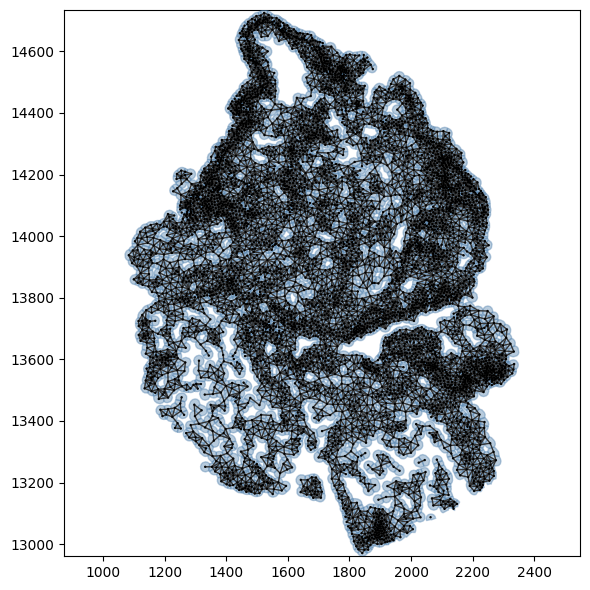

In [45]:
# Create a figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(6, 6))

# Plot the cell boundaries underneath the network
ms.visualise.visualise(
    pc,
    ax=ax,
    objects_to_plot=('collection', 'Cell boundaries'),
    marker_size=10,
    add_cbar=False,
    shape_kwargs={'color': '#4D7EAB', 
                  'alpha': 0.4, 
                  'edgecolor': 'black'},
)

# Plot the contact network on top of the cell boundaries
ms.visualise.visualise_network(
    pc,
    network_name='Contact network',
    ax=ax,
    edge_weight_name=None,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), 
                        marker_size=0.5,
                        color_by=('constant','black')
                        )
)

# KNN based networks

Network_method argument and defining the number of neighbours we’d like to connect for every node using the number_of_nearest_neighbours parameter

In [30]:
# Generate a K-Nearest Neighbours (KNN) network on the 'Cell centroids' data with k neighbors
k_list = [2, 5, 10, 15]

for k in k_list:
    ms.networks.generate_network(
        pc,
        network_name=f"{k}-NN network",
        network_type='KNN',
        objects_as_nodes=('collection', 'Cell centroids'),
        number_of_nearest_neighbours=k
    )

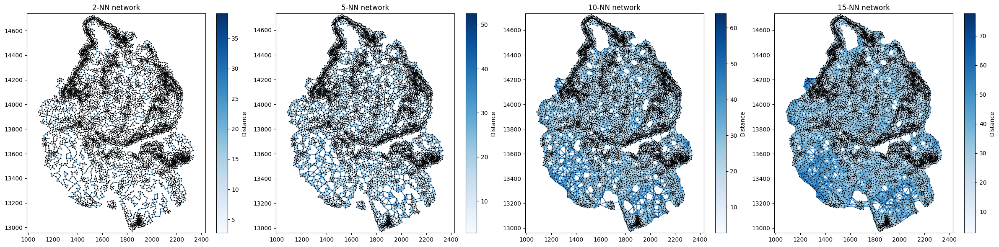

In [31]:
fig, axes = plt.subplots(1, len(k_list), figsize=(6 * len(k_list), 6))

if len(k_list) == 1:
    axes = [axes]  # Ensure axes is iterable

for i, k in enumerate(k_list):
    axes[i].set_title(f"{k}-NN network")
    ms.visualise.visualise_network(
        pc,
        network_name=f"{k}-NN network",
        ax=axes[i],
        edge_weight_name='Distance',
        edge_cmap=color_map,
        visualise_kwargs=dict(
            objects_to_plot=('collection', 'Cell centroids'),
            marker_size=1,
            color_by=('constant', 'black')
        )
    )

plt.tight_layout()
plt.show()

We can see that each object should be connected to only 10 other objects in our domain

In [32]:
# Initialize an empty list to store the number of neighbours for each node
number_of_neighbours_check = []

# Iterate through each node in the 'f"{k}-NN network"k'
for node in pc.networks[f"{k}-NN network"].nodes():
    # Append the number of neighbours for the current node to the list
    number_of_neighbours_check.append(len(list(pc.networks[f"{k}-NN network"].neighbors(node))))

# Print the number of adjacent nodes for the first 100 nodes
print('Number of adjacent nodes for the first 100 nodes:', number_of_neighbours_check[:100])

Number of adjacent nodes for the first 100 nodes: [15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15]


# Spatial Statistics

### Cross pair correlation function (cross-PCF)

The cross pair correlation function (cross-PCF, also known as the Radial Distribution Function) is a spatial statistic that characterises clustering or exclusion at different length scales. Consider two populations of points, that we’ll call 
 and 
. Then the cross-PCF, 
, can be thought of as a ratio describing whether the observed number of pairs of points separated by distance 
 (where one is type 
 and the other type 
) is higher or lower than would be expected under a statistical null model. In brief, 
 indicates increased numbers of 
 pairs separated by distance 
, which indicates clustering. 
 suggests exclusion, or regularity.

In [34]:
# # Query the domain for points of Celltype D
# pop = ms.query.query(pc, ('label', 'Regis_cluster'), 'is', 'Mast cells')

# # Calculate the cross-PCF for points of Celltype D with themselves
# # max_R: maximum radius to consider
# # annulus_step: step size for the annulus
# # annulus_width: width of the annulus
# # visualise_output: whether to visualise the output
# r, PCF = ms.spatial_statistics.cross_pair_correlation_function(
#     domain=pc,
#     population_A=pop,
#     population_B=pop,
#     max_R=200,
#     annulus_step=5,
#     annulus_width=25,
#     visualise_output=True
# )

In [35]:
# Clusters
cluster_labels = 'Regis_cluster'
celltypes = pc.labels[cluster_labels]['labels'].tolist()
celltypes = np.unique(celltypes)

# Define the cell types to be analyzed
celltypes = pc.labels[cluster_labels]['labels'].tolist()
celltypes = np.unique(celltypes)

In [36]:

# # Create a n x n subplot for visualizing the cross-PCF for each combination of cell types
# fig, axes = plt.subplots(len(celltypes), len(celltypes), figsize=(40, 40))

# # Loop through each combination of cell types
# for i in range(len(celltypes)):
#     for j in range(len(celltypes)):
#         pop_A = ms.query.query(pc, ('label', cluster_labels), 'is', celltypes[i])
#         pop_B = ms.query.query(pc, ('label', cluster_labels), 'is', celltypes[j])
#         r, PCF = ms.spatial_statistics.cross_pair_correlation_function(
#             pc,
#             pop_A,
#             pop_B,
#             max_R=200,
#             annulus_step=5,
#             annulus_width=25
#         )

#         # Select the current subplot
#         ax = axes[i, j]

#         # Plot the cross-PCF
#         ax.plot(r, PCF)

#         # Add a horizontal line at y=1 to indicate the CSR baseline
#         ax.axhline(1, color='k', linestyle=':')

#         # Set the y-axis limit
#         ax.set_ylim([0, 7])

#         # Label the y-axis with the cross-PCF notation
#         ax.set_ylabel(f'$g_{{{celltypes[i]}{celltypes[j]}}}(r)$')

#         # Label the x-axis with the distance r
#         ax.set_xlabel('$r$')

# # Adjust the layout to prevent overlap
# plt.tight_layout()

(<Figure size 1000x800 with 2 Axes>, <Axes: >)

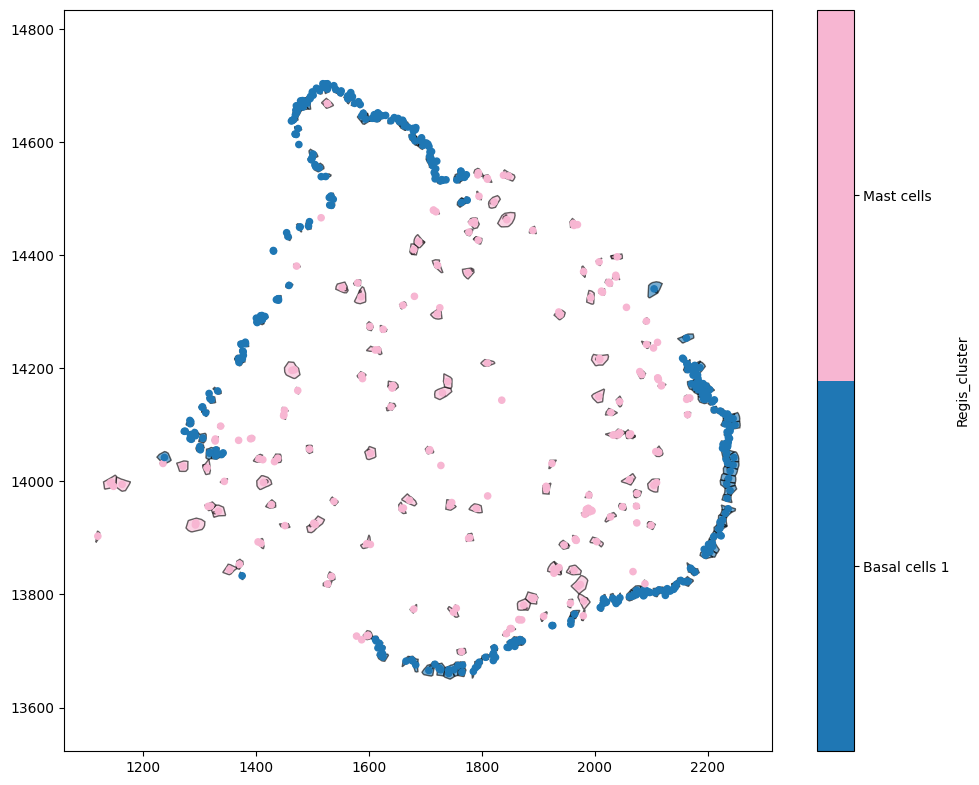

In [37]:
# Query points with labels "Basal cells 1" or "Mast cells"
query_ab = ms.query.query(pc, ('label', cluster_labels), 'in', ["Basal cells 1", "Mast cells"])

ms.visualise.visualise(
    pc, 
    color_by=('label', cluster_labels),
    objects_to_plot=query_ab
)

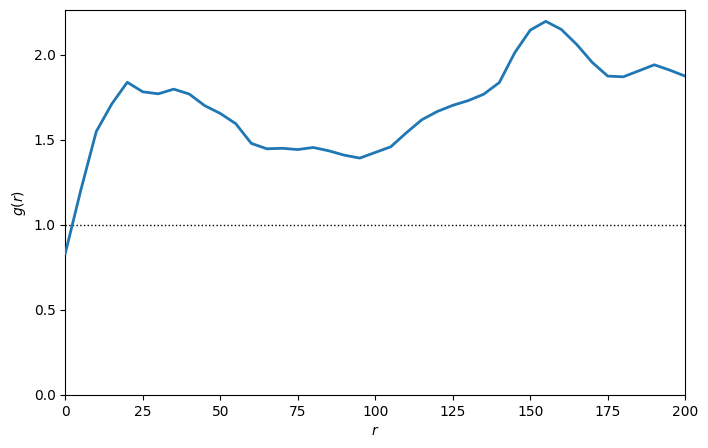

In [38]:

# Create a n x n subplot for visualizing the cross-PCF for each combination of cell types

pop_A = ms.query.query(pc, ('label', cluster_labels), 'is', "Basal cells 1")
pop_B = ms.query.query(pc, ('label', cluster_labels), 'is', "Mast cells")

# Calculate the cross-PCF for points of Celltype D with themselves
# max_R: maximum radius to consider
# annulus_step: step size for the annulus
# annulus_width: width of the annulus
# visualise_output: whether to visualise the output
r, PCF = ms.spatial_statistics.cross_pair_correlation_function(
    domain=pc,
    population_A=pop_A,
    population_B=pop_B,
    max_R=200,
    annulus_step=5,
    annulus_width=25,
    visualise_output=True
)

### The weighted pair correlation function (wPCF)
The weighted pair correlation function (wPCF) is a spatial statistic that extends the standard pair correlation function to identify spatial relationships between two point populations, one of which is labelled with a continuous mark. For full details, see https://doi.org/10.1371/journal.pcbi.1010994 or https://doi.org/10.1017/S2633903X24000011.

In this tutorial, we briefly reproduce the example from Figure 3 of Quantification of spatial and phenotypic heterogeneity in an agent-based model of tumour-macrophage interactions (PLOS Computational Biology 19(3) https://doi.org/10.1371/journal.pcbi.1010994). We start by placing a line of points from population 
 across the line 
, and a second population 
 placed randomly across the domain. Population 
 points are assigned a mark 


In [39]:
# # Visualize the domain with points colored by their mark
# ms.visualise.visualise(pc, 
#                        color_by='EPCAM', 
#                        figure_kwargs={'figsize': (8, 6)})

In [40]:
# # Query population A from the domain
# popA = ms.query.query(pc, ('label', cluster_labels), 'is', 'Cluster 8')

# # Query population B from the domain
# popB = ms.query.query(pc, ('label', cluster_labels), 'is', 'Cluster 2')

# # Calculate the weighted pair correlation function (wPCF)
# # Parameters:
# # - domain: the domain containing the points
# # - popA: the first population of points (A)
# # - popB: the second population of points (B)
# # - mark_pop_B: the label/mark associated with population B
# # - max_R: the maximum radius to consider for the wPCF
# # - annulus_step: the step size for the annulus radii
# # - annulus_width: the width of each annulus
# radii, wPCF = ms.spatial_statistics.weighted_pair_correlation_function(
#     pc, 
#     popA, 
#     popB, 
#     mark_pop_B='EPCAM', 
#     max_R=1, 
#     annulus_step=0.1, 
#     annulus_width=0.15
# )


### Spatial Autocorrelation (Hotspot Analysis)
much they are expressed. Certain genes may be highly active in one region of a tumor while nearly silent in another, and these spatial patterns can provide crucial insights into tumor heterogeneity, the tumor microenvironment, and treatment resistance.

To detect and quantify these spatial patterns, we use spatial autocorrelation—a statistical approach that helps us determine whether high or low expression levels of a given gene or marker cluster together within a tissue sample or are randomly distributed. This type of analysis is often called hotspot analysis because it allows us to identify regions of significantly high or low expression—or “hot” and “cold” spots—within the spatial landscape of a tissue.

*Compute Moran’s I and Getis-Ord on grid-like data.*

In [41]:
cd3 = ms.query.query(pc, ('label', "Transcript ID"), 'is', "CD3D")

This dataset is composed of point-like data however hotspot analysis is typically conducted on lattice- or grid-like data (think states on a map of the US). More recently, hotspot analysis has emerged as a useful tool in cancer research for analysising regional transcriptomics datasets such as those produced using Visium HD. In fact, spatial autocorrelations can be computed on any type of spatial data - not just grid-like data! We’ll see this later in this tutorial.

In [42]:
# Generate a hexagonal grid over the example domain
# - side_length: length of the side of each hexagon
# - regions_collection_name: name of the collection of hexagonal regions

length_list = [50,100]  # Set the side length of the hexagons

for length in length_list:
    ms.region_based.generate_hexgrid(pc, 
                                    side_length=length, 
                                    regions_collection_name=f"Hexgrids {length}")

In [43]:
print(pc)

Domain name: Regis
Number of objects: 26925
Collections: ['Cell boundaries', 'Nucleus boundaries', 'Transcripts', 'Cell centroids', 'Hexgrids 50', 'Hexgrids 100']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area', 'Transcript ID', 'Regis_cluster', 'ROI', 'region counts: aaianhje-1', 'region counts: aaibfllk-1', 'region counts: aaigkijb-1', 'region counts: aaigonfn-1', 'region counts: aaihcbpj-1', 'region counts: aaihdopi-1', 'region counts: aaiidddk-1', 'region counts: aaiihicg-1', 'region counts: aaiipnan-1', 'region counts: aaikgngh-1', 'region counts: aaikohdn-1', 'region counts: aaimnhgk-1', 'region counts: aainnmnf-1', 'region counts: aajefbgl-1', 'region counts: aajgenlc-1', 'region counts: aajgfdop-1', 'region counts: aajhdpip-1', 'region counts: aajhhaje-1', 'region counts: aajhoami-1', 'region counts: aajijaio-1', 'region counts: aajkahpb-1', 'region counts: aajkknpa-1', 'region counts: aajljklb-1', 'region counts: aajmdeea-1', 'region counts: 

(<Figure size 1300x600 with 3 Axes>, <Axes: >)

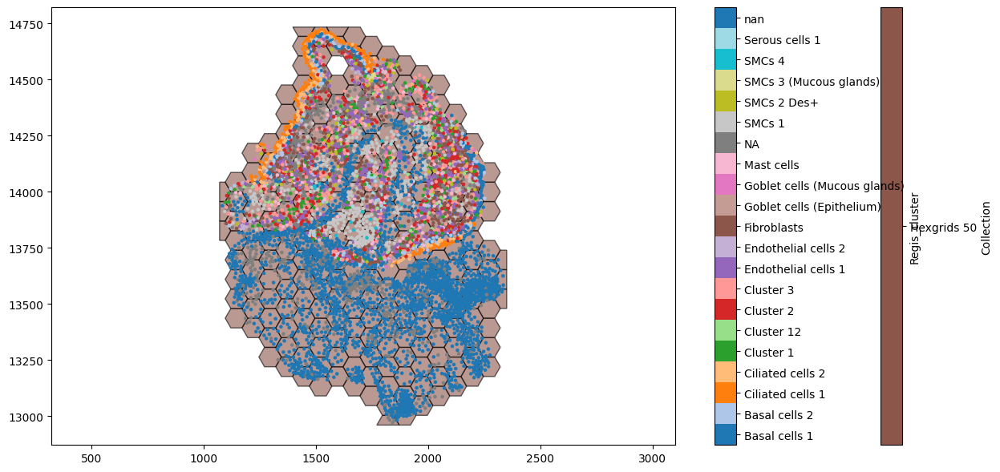

In [48]:
fig,ax=plt.subplots(figsize=(13,6))
ms.visualise.visualise(pc, 
                       #color_by='region counts: T Helper Cell',
                       objects_to_plot=('collection','Hexgrids 50'),
                       ax=ax) 
ms.visualise.visualise(pc, 
                       color_by='Regis_cluster',
                       objects_to_plot=('collection','Cell centroids'),
                       ax=ax,
                       marker_size=5)  # plot the points

*Compute Moran’s I and Getis-Ord directly on spatial data (point-like / any MuSpAn object)*

## Spatial Network Analysis

###  Neighbourhood clustering

In [51]:
# Perform neighbourhood clustering on the dataset using KNN and minibatchkmeans
# ? Can I call a network I already created and stored in Networks?

neighbourhood_enrichment_matrix, consistent_global_labels, unique_cluster_labels = ms.networks.cluster_neighbourhoods(
    pc,  # The domain dataset
    label_name=cluster_labels,  # The label to use for clustering
    network_kwargs=dict(network_type='KNN', 
                        max_edge_distance=np.inf, 
                        min_edge_distance=0, 
                        number_of_nearest_neighbours=10),  # The network parameters
    k_hops=1,  # The number of hops to consider for the neighbourhood
    neighbourhood_label_name='Neighbourhood ID',  # Name for the neighbourhood label
    cluster_method='minibatchkmeans',  # Clustering method
    cluster_parameters={'n_clusters': 6},  # Parameters for the clustering method
    neighbourhood_enrichment_as='log-fold' # Neighbourhood enrichment as log-fold
)

(<Figure size 1000x800 with 2 Axes>, <Axes: >)

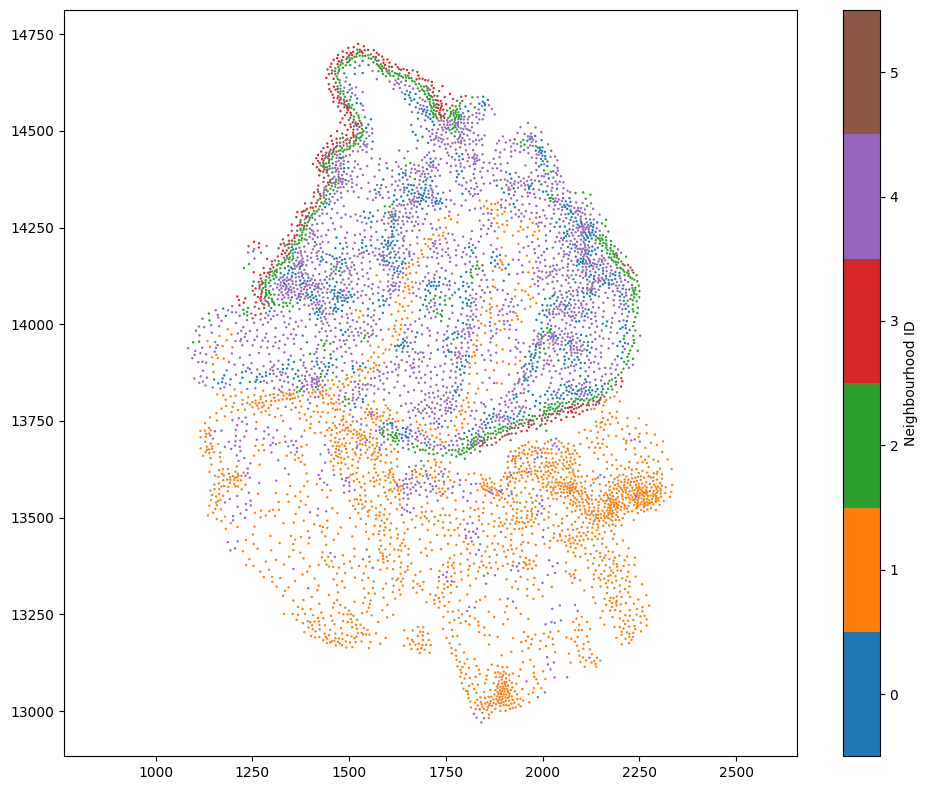

In [53]:
# Visualize the dataset with the neighbourhood clustering results
ms.visualise.visualise(pc, 
                       color_by='Neighbourhood ID',
                       marker_size=0.5,
                       objects_to_plot=('collection', 'Cell centroids')
)

In [56]:
# Create a DataFrame from the neighbourhood enrichment matrix
df_ME_id = pd.DataFrame(data=neighbourhood_enrichment_matrix, 
                        index=unique_cluster_labels, 
                        columns=consistent_global_labels)
df_ME_id.index.name = 'Neighbourhood ID'
df_ME_id.columns.name = 'Celltype ID'

# Check for non-finite values
non_finite_mask = ~np.isfinite(df_ME_id.values)

if non_finite_mask.any():
    print("Warning: Non-finite values found. Replacing with 0.")
    df_ME_id = df_ME_id.replace([np.inf, -np.inf], np.nan).fillna(0)


In [ ]:
# Visualize the neighbourhood enrichment matrix using a clustermap
sns.clustermap(
    df_ME_id,
    xticklabels=consistent_global_labels,
    yticklabels=unique_cluster_labels,
    figsize=(7.5, 3.5),
    cmap='RdBu_r',
    dendrogram_ratio=(.05, .3),
    col_cluster=True,
    row_cluster=True,
    square=True,
    linewidths=0.5,
    linecolor='black',
    cbar_kws=dict(use_gridspec=False, 
                  location="top", 
                  label='Neighbourhood enrichment (log-fold)', 
                  ticks=[-2, 0, 2]),
    cbar_pos=(0.12, 0.75, 0.72, 0.08),
    vmin=-2,
    vmax=2,
    tree_kws={'linewidths': 0, 'color': 'white'}
)

# Topological Data Analysis

# Distribution Analysis

# Quantifying Morphology